In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import sys
import re
import json
from collections import defaultdict
from functools import reduce, partial
from typing import List, Set, Tuple, Union
from multiprocessing import Pool

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
# from Bio.Data import CodonTable
# from Bio.Data.CodonTable import NCBICodonTableDNA
# from Bio import SeqIO
from scipy import spatial
from scipy.spatial.distance import pdist, cdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage

# from mutspec.annotation import (
#     calculate_mutspec, CodonAnnotation, mutations_summary, 
#     translator, rev_comp, lbl2lbl_id, lbl_id2lbl
# )
from pymutspec.constants import possible_codons, possible_sbs12, possible_sbs192
# from mutspec.io import read_genbank_ref
# from mutspec.draw.mut import plot_mutspec12, plot_mutspec192, plot_mutspec192kk

sns.set_style()

## Read expected counts and spectra

In [2]:
spectra192 = pd.read_csv('../data/new_dataset/MutSpecVertebrates192.csv.gz')
species = spectra192[['Gene', 'Class', 'Species']].drop_duplicates()
species.columns = species.columns.str.lower()
species

,gene,class,species
0,CO1,Mammalia,Crocuta_crocuta
192,CO1,Mammalia,Homo_sapiens
384,CO1,Mammalia,Eothenomys_melanogaster
576,CO1,Mammalia,Geomys_arenarius
768,CO1,Mammalia,Urocyon_cinereoargenteus
...,...,...,...
549312,CO3,Mammalia,Pan_troglodytes
549504,CO3,Mammalia,Bison_priscus
549696,CO3,Mammalia,Martes_zibellina
549888,CO3,Mammalia,Trachypithecus_phayrei


In [44]:
# gene-class species counts in new dataset
_scpesies_cnt = species.groupby(['gene', 'class']).species.count().unstack()
_scpesies_cnt.to_csv('../data/species_cnt_filtered.csv')

In [3]:
exp_freqs = pd.read_csv('../data/new_dataset/expected.csv')
exp_freqs = species.merge(exp_freqs)
exp_freqs

,gene,class,species,msa_nseqs,msa_ncols,acgt_share,A>C,A>G,A>T,C>A,...,C[T>G]G,C[T>G]T,G[T>G]A,G[T>G]C,G[T>G]G,G[T>G]T,T[T>G]A,T[T>G]C,T[T>G]G,T[T>G]T
0,CO1,Mammalia,Crocuta_crocuta,15,1542,0.999741,115.066667,173.333333,115.066667,71.466667,...,15.133333,9.800000,4.866667,1.133333,4.666667,4.400000,4.400000,5.066667,1.933333,2.066667
1,CO1,Mammalia,Homo_sapiens,499,1539,0.999939,114.446894,183.314629,114.446894,97.278557,...,12.016032,3.010020,1.997996,0.967936,2.987976,3.012024,2.887776,2.955912,1.012024,2.032064
2,CO1,Mammalia,Eothenomys_melanogaster,21,1539,0.999598,128.285714,199.333333,128.285714,77.904762,...,6.238095,2.761905,2.190476,1.000000,2.333333,2.000000,6.000000,4.904762,1.000000,3.714286
3,CO1,Mammalia,Geomys_arenarius,12,1530,1.000000,117.166667,188.583333,117.166667,39.333333,...,13.500000,9.666667,8.666667,1.333333,2.916667,3.666667,7.750000,5.000000,4.000000,8.000000
4,CO1,Mammalia,Urocyon_cinereoargenteus,51,1542,1.000000,96.313725,158.313725,96.313725,61.058824,...,11.568627,3.450980,4.980392,1.000000,2.490196,2.000000,5.941176,4.686275,1.509804,4.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2861,CO3,Mammalia,Pan_troglodytes,67,783,0.999828,56.985075,96.373134,56.985075,56.985075,...,1.014925,3.910448,1.000000,1.358209,0.000000,0.000000,1.940299,0.000000,0.029851,2.328358
2862,CO3,Mammalia,Bison_priscus,31,780,0.998842,49.709677,90.967742,49.709677,53.129032,...,3.032258,4.709677,0.000000,0.032258,0.000000,1.000000,1.000000,0.000000,0.032258,4.000000
2863,CO3,Mammalia,Martes_zibellina,30,783,1.000000,57.966667,97.133333,57.966667,42.933333,...,1.000000,2.000000,0.000000,0.000000,0.000000,2.966667,2.066667,3.033333,0.000000,3.000000
2864,CO3,Mammalia,Trachypithecus_phayrei,22,783,1.000000,51.954545,99.909091,51.954545,38.454545,...,3.000000,4.636364,0.136364,1.090909,1.090909,3.318182,3.681818,2.045455,3.000000,2.045455


In [4]:
cxt_df = pd.read_csv('../data/new_dataset/exp_cxt_freqs.csv')
cxt_df = cxt_df.merge(exp_freqs[['gene', 'species', 'class']], on=['gene', 'species'])
cxt_df

,gene,species,AAA,AAC,AAG,AAT,ACA,ACC,ACG,ACT,...,TCT,TGA,TGC,TGG,TGT,TTA,TTC,TTG,TTT,class
0,ND2,Pica_pica,3.985714,6.600000,6.400000,5.957143,6.371429,8.028571,1.957143,11.371429,...,15.814286,4.885714,0.828571,2.571429,0.000000,9.571429,5.414286,4.000000,9.857143,Aves
1,ND2,Motacilla_tschutschensis,4.000000,9.069444,6.972222,3.013889,9.013889,9.333333,1.986111,21.069444,...,15.152778,4.097222,5.861111,3.000000,1.958333,5.986111,4.194444,2.000000,4.000000,Aves
2,ND2,Symposiachrus_trivirgatus,4.000000,7.057143,6.028571,3.314286,9.685714,10.914286,0.657143,18.800000,...,11.828571,4.885714,2.342857,5.000000,3.257143,11.142857,6.257143,2.000000,11.057143,Aves
3,ND2,Zonotrichia_capensis,4.909091,7.181818,6.454545,5.818182,8.181818,7.545455,1.000000,12.636364,...,16.909091,4.636364,1.000000,1.090909,3.363636,3.636364,3.000000,4.272727,6.909091,Aves
4,ND2,Poecile_montanus,4.925926,7.120370,6.000000,1.990741,7.990741,10.935185,3.870370,13.074074,...,14.620370,0.861111,2.925926,3.037037,2.064815,5.009259,4.055556,2.027778,1.074074,Aves
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2861,CO3,Pan_troglodytes,3.119403,3.000000,7.880597,3.985075,4.104478,6.985075,3.000000,16.955224,...,12.537313,1.462687,1.626866,1.014925,0.970149,9.089552,4.880597,4.089552,6.388060,Mammalia
2862,CO3,Bison_priscus,3.000000,2.000000,9.000000,2.032258,3.870968,7.870968,5.000000,13.032258,...,12.870968,1.000000,1.967742,0.806452,1.000000,10.000000,3.000000,3.967742,9.000000,Mammalia
2863,CO3,Martes_zibellina,2.000000,2.100000,7.333333,1.000000,3.966667,4.100000,6.233333,15.766667,...,14.000000,1.966667,3.000000,1.633333,2.100000,6.066667,3.033333,2.000000,4.000000,Mammalia
2864,CO3,Trachypithecus_phayrei,6.045455,3.000000,6.909091,1.181818,2.136364,7.227273,3.954545,13.045455,...,20.681818,1.000000,0.636364,0.000000,0.000000,10.863636,4.863636,10.045455,6.545455,Mammalia


In [16]:
# num of non-zero cxts in species
# any possible trinucleotide context can be found in Cytb (only based on syn mutations), 
# but not every context can raise syn mutation (1 posiiton)
nnz = (cxt_df[possible_codons] > 0).sum(axis=1).rename('nnonzero').to_frame()
nnz['class'] = cxt_df['class'].values
nnz.groupby('class').nnonzero.describe().drop(['mean', 'std'], axis=1).astype(int)

,count,min,25%,50%,75%,max
class,,,,,,
Actinopteri,693,49,60,62,63,64
Amphibia,182,53,60,62,63,64
Aves,512,51,57,59,61,64
Lepidosauria,379,51,60,62,63,64
Mammalia,1100,43,58,60,62,64


### Save supplementary tables with cytb sbs/cxt counts

In [28]:
average_class_cxt = cxt_df.set_index(['gene', 'class', 'species']).mean(level=[0, 1])#.T
average_class_cxt.columns.name = 'triplet'
average_class_cxt = average_class_cxt.T.sort_values(('Cytb', 'Mammalia'), ascending=False)
average_class_cxt.to_csv('../data/average_class_cxt_freqs.csv')
average_class_cxt

gene           ND2                                                       CO1  \
class         Aves   Mammalia Lepidosauria Actinopteri   Amphibia   Mammalia   
triplet                                                                        
CCT      23.987112  16.706190    18.586721   19.209665  16.845179  19.465975   
TCC      17.060217  10.781785     7.378075   10.245740   6.644723  13.474731   
TCT      16.650342  11.867311    10.283929   10.156470  10.769808  21.949335   
TAG      12.118706  13.625438    12.679543   13.324449  12.530973  26.398017   
ACT      16.534544  18.724203    16.206616   11.734531  12.255649  19.392580   
...            ...        ...          ...         ...        ...        ...   
CGT       0.389897   0.405761     0.302034    0.842186   0.597530   1.033947   
CGA       0.928010   0.653806     0.854953    1.615138   0.838224   0.622907   
CGC       0.885453   0.599829     0.858802    1.635556   1.065804   0.823060   
GGC       0.882925   0.322301     0.607644    2.102001   0.617432   0.580411   
AGG       0.724138   0.287050     0.477008    1.749717   0.310899   0.965155   

gene                                                         Cytb  \
class   Actinopteri       Aves Lepidosauria   Amphibia   Mammalia   
triplet                                                             
CCT       21.210207  29.331223    23.131764  16.243880  22.428191   
TCC       17.844437  24.536231    13.817464  11.185186  20.899921   
TCT       22.381432  24.532177    17.224952  18.698803  18.116616   
TAG       20.454937  28.177953    20.437970  18.948432  18.048474   
ACT       16.805831  24.797113    20.438582  14.057744  15.625537   
...             ...        ...          ...        ...        ...   
CGT        0.730419   0.593664     0.613043   1.151825   0.506581   
CGA        1.156228   0.406246     0.557634   0.452190   0.313939   
CGC        1.691845   0.480842     1.118322   1.832694   0.308838   
GGC        0.727217   0.144705     0.717544   1.407599   0.301270   
AGG        1.359519   0.548368     1.495344   1.316791   0.200211   

gene                                                          CO3              \
class   Lepidosauria Actinopteri   Amphibia       Aves   Mammalia Actinopteri   
triplet                                                                         
CCT        22.034367   22.498138  16.101692  32.615626  12.099241   11.746084   
TCC        16.797608   19.648027  13.804675  27.141427   9.155769   10.931973   
TCT        17.903246   19.027429  17.847466  17.858228  12.502144   12.415540   
TAG        11.881952   14.618468  12.686735  20.472508   9.247627    9.167656   
ACT        16.980098   15.358595  12.128718  19.663725  11.813458    9.881944   
...              ...         ...        ...        ...        ...         ...   
CGT         0.685455    1.270298   1.043666   0.490910   0.156078    0.352930   
CGA         0.440347    0.885401   0.689709   0.266899   0.374975    0.324554   
CGC         0.392186    1.166793   0.771870   0.660964   0.438335    0.722164   
GGC         0.415116    0.835824   0.808546   0.220179   0.736505    0.767589   
AGG         0.381617    0.495789   0.508884   0.168624   0.910794    1.813050   

gene                                       
class    Amphibia Lepidosauria       Aves  
triplet                                    
CCT      7.830726    13.677083  16.981823  
TCC      5.149532     9.261046  16.483150  
TCT      9.894175     9.153222  12.209135  
TAG      8.465264    10.305330  12.905948  
ACT      6.831250    12.283841  14.801346  
...           ...          ...        ...  
CGT      0.620748     0.030777   0.487888  
CGA      0.273016     0.217803   0.001563  
CGC      0.591383     0.364583   0.343125  
GGC      0.984779     1.241285   0.537728  
AGG      2.206122     1.253325   0.374787  

[64 rows x 20 columns]

In [30]:
average_class_cxt = exp_freqs.set_index(['gene', 'class', 'species'])[possible_sbs192]\
    .mean(level=[0, 1])
average_class_cxt.columns.name = 'Substitution'
average_class_cxt = average_class_cxt.T.sort_values(('Cytb', 'Mammalia'), ascending=False)
average_class_cxt.to_csv('../data/average_class_exp_freqs.csv')
average_class_cxt

gene                CO1                                                 \
class          Mammalia Actinopteri       Aves Lepidosauria   Amphibia   
Substitution                                                             
C[C>T]T       19.465975   21.210207  29.331223    23.131764  16.243880   
T[C>T]C       13.474731   17.844437  24.536231    13.817464  11.185186   
T[C>T]T       21.949335   22.381432  24.532177    17.224952  18.698803   
T[A>G]G       26.398017   20.454937  28.177953    20.437970  18.948432   
A[C>T]T       19.392580   16.805831  24.797113    20.438582  14.057744   
...                 ...         ...        ...          ...        ...   
A[G>C]G        0.000000    0.000000   0.000000     0.000000   0.000000   
A[G>C]T        0.000000    0.000000   0.000000     0.000000   0.000000   
A[G>T]C        0.000000    0.000000   0.000000     0.000000   0.000000   
A[G>T]A        0.000000    0.000000   0.000000     0.000000   0.000000   
A[A>C]A        0.000000    0.000000   0.000000     0.000000   0.000000   

gene               Cytb                                                 \
class          Mammalia Lepidosauria Actinopteri   Amphibia       Aves   
Substitution                                                             
C[C>T]T       22.428191    22.034367   22.498138  16.101692  32.615626   
T[C>T]C       20.899921    16.797608   19.648027  13.804675  27.141427   
T[C>T]T       18.116616    17.903246   19.027429  17.847466  17.858228   
T[A>G]G       18.048474    11.881952   14.618468  12.686735  20.472508   
A[C>T]T       15.625537    16.980098   15.358595  12.128718  19.663725   
...                 ...          ...         ...        ...        ...   
A[G>C]G        0.000000     0.000000    0.000000   0.000000   0.000000   
A[G>C]T        0.000000     0.000000    0.000000   0.000000   0.000000   
A[G>T]C        0.000000     0.000000    0.000000   0.000000   0.000000   
A[G>T]A        0.000000     0.000000    0.000000   0.000000   0.000000   
A[A>C]A        0.000000     0.000000    0.000000   0.000000   0.000000   

gene                ND2                                                 \
class              Aves   Mammalia Lepidosauria Actinopteri   Amphibia   
Substitution                                                             
C[C>T]T       23.987112  16.706190    18.586721   19.209665  16.845179   
T[C>T]C       17.060217  10.781785     7.378075   10.245740   6.644723   
T[C>T]T       16.650342  11.867311    10.283929   10.156470  10.769808   
T[A>G]G       12.118706  13.625438    12.679543   13.324449  12.530973   
A[C>T]T       16.534544  18.724203    16.206616   11.734531  12.255649   
...                 ...        ...          ...         ...        ...   
A[G>C]G        0.000000   0.000000     0.000000    0.000000   0.000000   
A[G>C]T        0.000000   0.000000     0.000000    0.000000   0.000000   
A[G>T]C        0.000000   0.000000     0.000000    0.000000   0.000000   
A[G>T]A        0.000000   0.000000     0.000000    0.000000   0.000000   
A[A>C]A        0.000000   0.000000     0.000000    0.000000   0.000000   

gene                CO3                                                
class          Mammalia Actinopteri  Amphibia Lepidosauria       Aves  
Substitution                                                           
C[C>T]T       12.099241   11.746084  7.830726    13.677083  16.981823  
T[C>T]C        9.155769   10.931973  5.149532     9.261046  16.483150  
T[C>T]T       12.502144   12.415540  9.894175     9.153222  12.209135  
T[A>G]G        9.247627    9.167656  8.465264    10.305330  12.905948  
A[C>T]T       11.813458    9.881944  6.831250    12.283841  14.801346  
...                 ...         ...       ...          ...        ...  
A[G>C]G        0.000000    0.000000  0.000000     0.000000   0.000000  
A[G>C]T        0.000000    0.000000  0.000000     0.000000   0.000000  
A[G>T]C        0.000000    0.000000  0.000000     0.000000   0.000000  
A[G>T]A        0.000000  

## Check exp syn mutations contexts

In [31]:
cd = pdist(cxt_df[possible_codons], 'cosine')
sq = squareform(cd)

<AxesSubplot:ylabel='Count'>

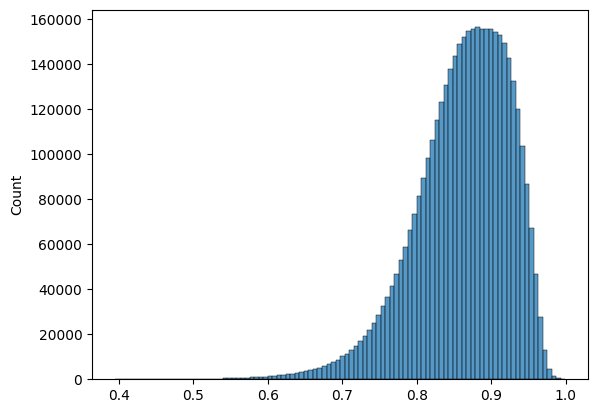

In [32]:
sns.histplot(1-cd, bins=100)

In [33]:
cxt_df.gene.value_counts().loc[cxt_df.gene.unique()]

ND2      850
CO1      206
Cytb    1697
CO3      113
Name: gene, dtype: int64

<AxesSubplot:xlabel='gene', ylabel='gene'>

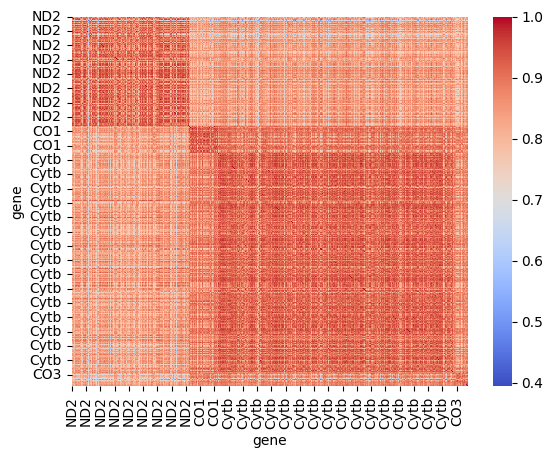

In [34]:
d = pd.DataFrame(1-sq, index=cxt_df.gene, columns=cxt_df.gene)
sns.heatmap(d, cmap='coolwarm')

### PCA on contexts

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

exp_wide = cxt_df[possible_codons]

scaled_data = (exp_wide.T / exp_wide.sum(axis=1)).T

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a new dataframe with the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['Gene'] = cxt_df['gene'].values
pca_df['Class'] = cxt_df['class'].values
pca_df = pca_df.sort_values('Gene')

# Get the variance share of each principal component
variance_ratio = pca.explained_variance_ratio_
variance_share_pc1 = round(variance_ratio[0]*100, 2)
variance_share_pc2 = round(variance_ratio[1]*100, 2)
print(f'PC1 ({variance_share_pc1}% variance)')
print(f'PC2 ({variance_share_pc2}% variance)')

PC1 (27.14% variance)
PC2 (16.15% variance)


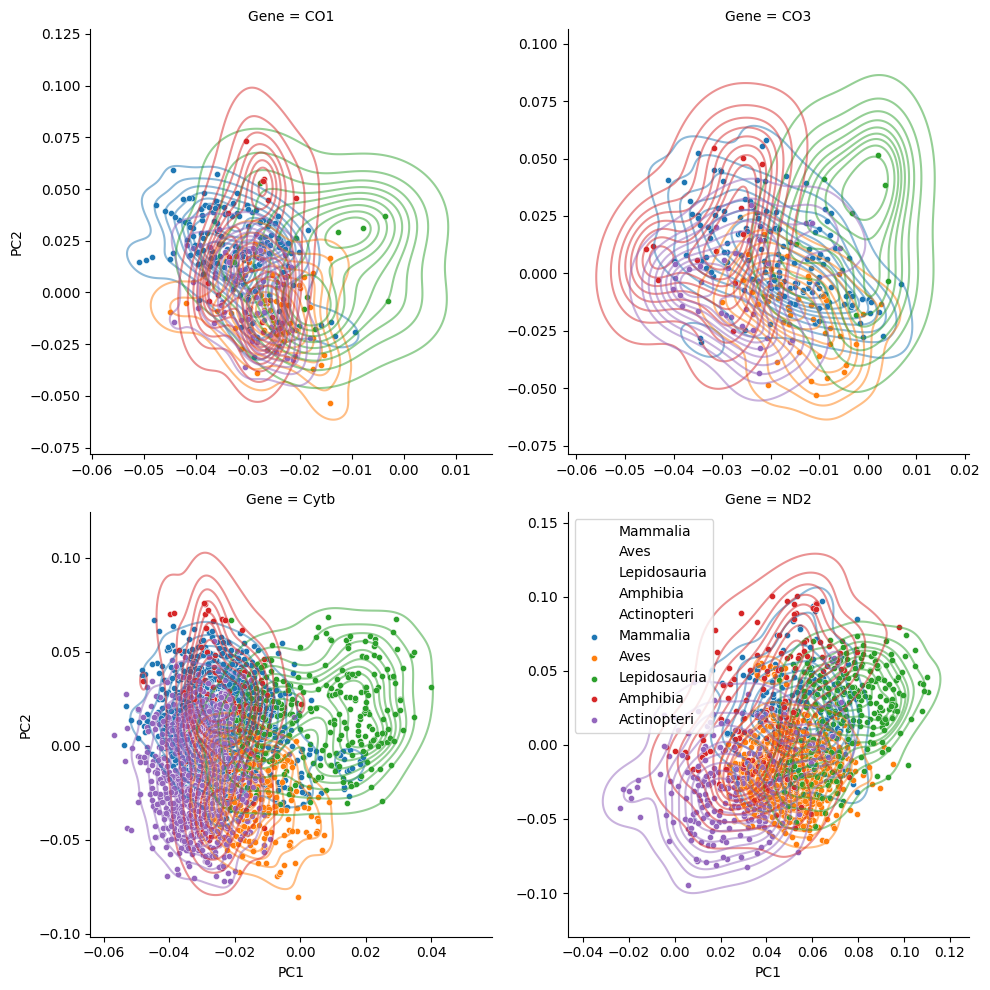

In [ ]:
g = sns.FacetGrid(data=pca_df, col='Gene', height=5, hue='Class', 
                  col_wrap=2, sharex=False, sharey=False)
g.map(sns.kdeplot, 'PC1', 'PC2', alpha=0.5, label=False)
g.map(sns.scatterplot, 'PC1', 'PC2', s=20)
plt.legend()
plt.show()

# Exp mut freqs

### Similarity Distributions

In [35]:
cd = pdist(exp_freqs[possible_sbs192], 'cosine')
sq = squareform(cd)

<AxesSubplot:ylabel='Count'>

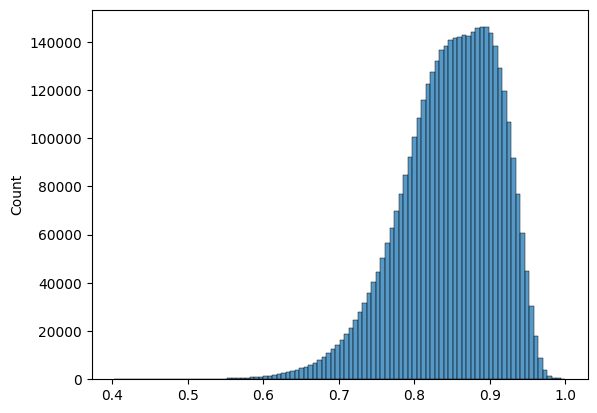

In [36]:
sns.histplot(1-cd, bins=100)

<AxesSubplot:xlabel='gene', ylabel='gene'>

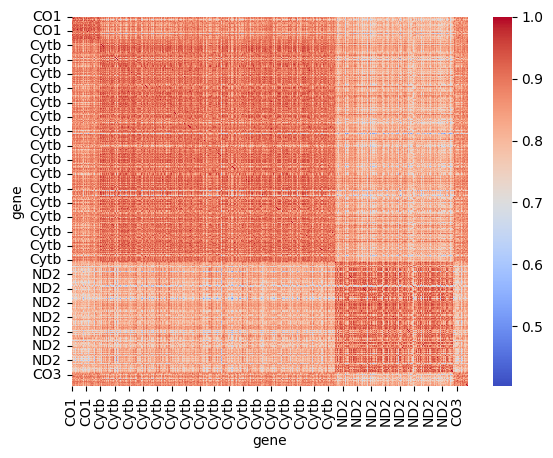

In [37]:
d = pd.DataFrame(1-sq, index=exp_freqs.gene, columns=exp_freqs.gene)
sns.heatmap(d, cmap='coolwarm')

### PCA on syn exp sbs

In [45]:
exp_freqs

,gene,class,species,msa_nseqs,msa_ncols,acgt_share,A>C,A>G,A>T,C>A,...,C[T>G]G,C[T>G]T,G[T>G]A,G[T>G]C,G[T>G]G,G[T>G]T,T[T>G]A,T[T>G]C,T[T>G]G,T[T>G]T
0,CO1,Mammalia,Crocuta_crocuta,15,1542,0.999741,115.066667,173.333333,115.066667,71.466667,...,15.133333,9.800000,4.866667,1.133333,4.666667,4.400000,4.400000,5.066667,1.933333,2.066667
1,CO1,Mammalia,Homo_sapiens,499,1539,0.999939,114.446894,183.314629,114.446894,97.278557,...,12.016032,3.010020,1.997996,0.967936,2.987976,3.012024,2.887776,2.955912,1.012024,2.032064
2,CO1,Mammalia,Eothenomys_melanogaster,21,1539,0.999598,128.285714,199.333333,128.285714,77.904762,...,6.238095,2.761905,2.190476,1.000000,2.333333,2.000000,6.000000,4.904762,1.000000,3.714286
3,CO1,Mammalia,Geomys_arenarius,12,1530,1.000000,117.166667,188.583333,117.166667,39.333333,...,13.500000,9.666667,8.666667,1.333333,2.916667,3.666667,7.750000,5.000000,4.000000,8.000000
4,CO1,Mammalia,Urocyon_cinereoargenteus,51,1542,1.000000,96.313725,158.313725,96.313725,61.058824,...,11.568627,3.450980,4.980392,1.000000,2.490196,2.000000,5.941176,4.686275,1.509804,4.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2861,CO3,Mammalia,Pan_troglodytes,67,783,0.999828,56.985075,96.373134,56.985075,56.985075,...,1.014925,3.910448,1.000000,1.358209,0.000000,0.000000,1.940299,0.000000,0.029851,2.328358
2862,CO3,Mammalia,Bison_priscus,31,780,0.998842,49.709677,90.967742,49.709677,53.129032,...,3.032258,4.709677,0.000000,0.032258,0.000000,1.000000,1.000000,0.000000,0.032258,4.000000
2863,CO3,Mammalia,Martes_zibellina,30,783,1.000000,57.966667,97.133333,57.966667,42.933333,...,1.000000,2.000000,0.000000,0.000000,0.000000,2.966667,2.066667,3.033333,0.000000,3.000000
2864,CO3,Mammalia,Trachypithecus_phayrei,22,783,1.000000,51.954545,99.909091,51.954545,38.454545,...,3.000000,4.636364,0.136364,1.090909,1.090909,3.318182,3.681818,2.045455,3.000000,2.045455


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

exp_wide = exp_freqs[possible_sbs192]

scaled_data = (exp_wide.T / exp_wide.sum(axis=1)).T

# Standardize the data
# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(scaled_data)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a new dataframe with the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['Gene'] = exp_freqs['gene'].values
pca_df['Class'] = exp_freqs['class'].values
pca_df = pca_df.sort_values('Gene')

# Get the variance share of each principal component
variance_ratio = pca.explained_variance_ratio_
variance_share_pc1 = round(variance_ratio[0]*100, 2)
variance_share_pc2 = round(variance_ratio[1]*100, 2)
print(f'PC1 ({variance_share_pc1}% variance)')
print(f'PC2 ({variance_share_pc2}% variance)')

PC1 (25.6% variance)
PC2 (16.54% variance)


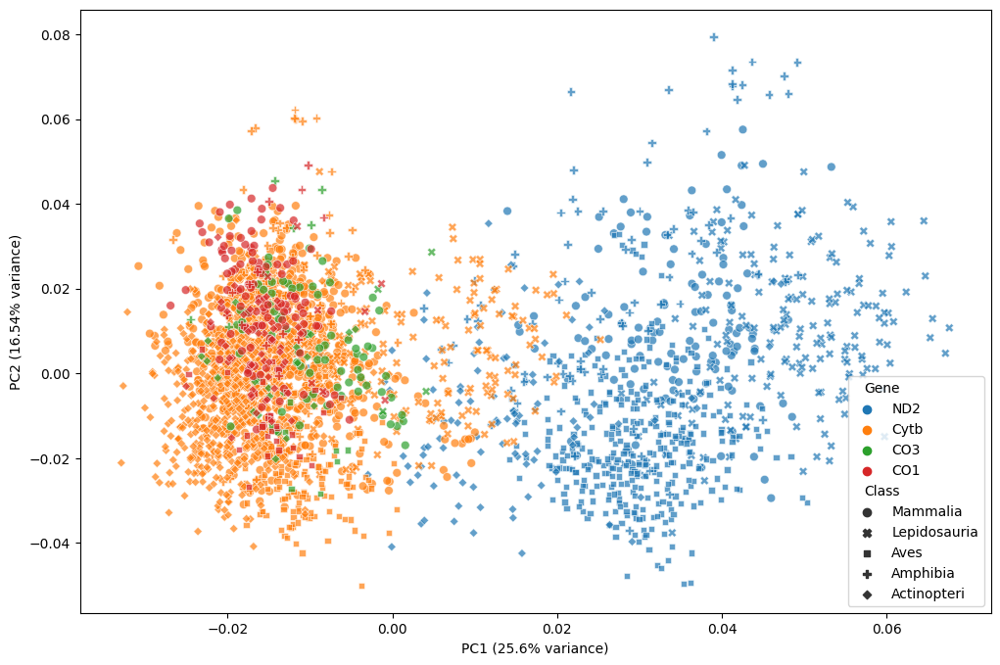

In [63]:
# Visualize the PCA results 
plt.figure(figsize=(12, 8))
g = sns.scatterplot(
    data=pca_df.sort_values(['Gene', 'Class'], ascending=False),
    x="PC1", y="PC2", hue="Gene", style='Class',
    # palette='',
    s=40, alpha=0.7,
)
plt.xlabel(f'PC1 ({variance_share_pc1}% variance)')
plt.ylabel(f'PC2 ({variance_share_pc2}% variance)')

# Move the legend outside of the plot to the right
# legend = g.ax_joint.legend(bbox_to_anchor=(1, 1.01), loc='upper left', fontsize=12)
# plt.subplots_adjust(right=1.0)  # Adjust the right margin to make space for the legend
plt.show()

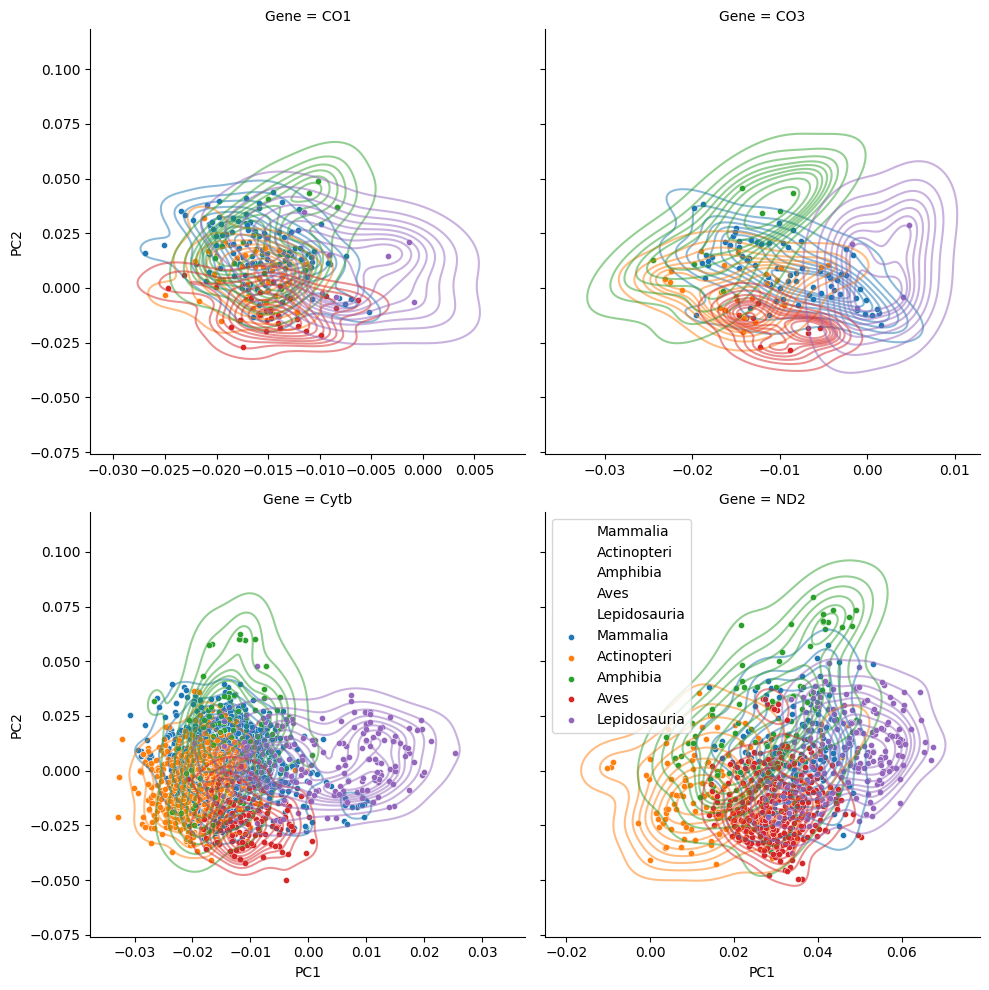

In [70]:
g = sns.FacetGrid(data=pca_df, col='Gene', height=5, hue='Class', col_wrap=2, sharex=False)
g.map(sns.kdeplot, 'PC1', 'PC2', alpha=0.5, label=False)
g.map(sns.scatterplot, 'PC1', 'PC2', s=20)
plt.legend()
plt.show()

In [91]:
g.ax_joint.get_xlim()

(-0.025033164962736124, 0.07870874745789425)

192 comp; CO1


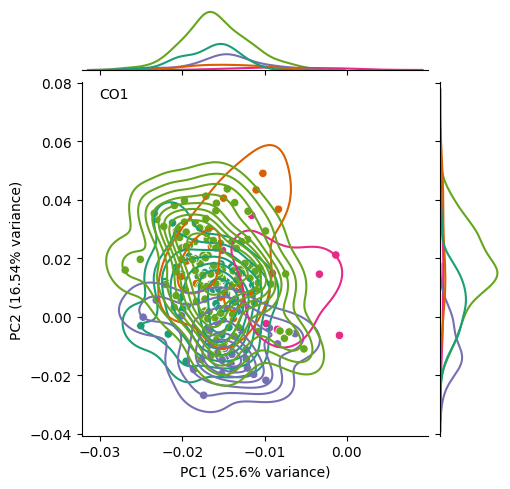

192 comp; CO3


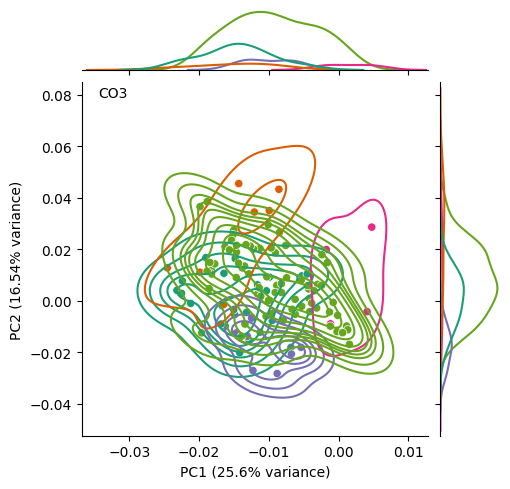

192 comp; Cytb


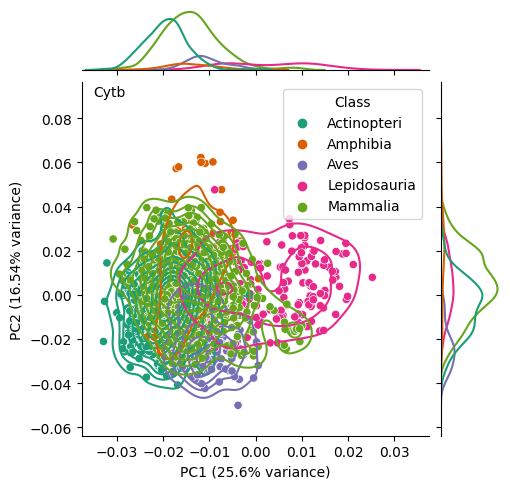

192 comp; ND2


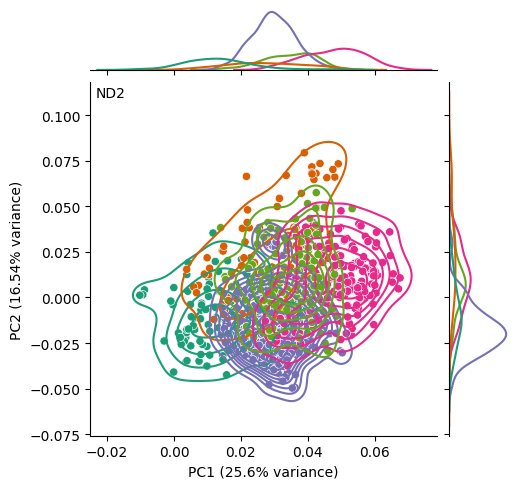

In [100]:
for x in pca_df.Gene.unique():
    # Visualize the PCA resultsexp_wide
    g = sns.jointplot(
        data=pca_df[pca_df.Gene == x].sort_values('Class'),
        x="PC1", y="PC2", hue="Class",
        palette='Dark2',
        s=10,
        height=5, kind='kde'
    )
    g.plot_joint(sns.scatterplot)#, palette='Dark2', s=10, zorder=0, levels=6)
    plt.xlabel(f'PC1 ({variance_share_pc1}% variance)')
    plt.ylabel(f'PC2 ({variance_share_pc2}% variance)')

    # plot gene label on the plot
    _x = g.ax_joint.get_xlim()[0]
    _y = g.ax_joint.get_ylim()[1]
    _x -= _x / 15
    _y -= _y / 15
    plt.text(_x, _y, x)

    print('192 comp; ' + x)
    if x != 'Cytb':
        g.ax_joint.get_legend().remove()
    plt.show()

# Spectra homogenity

In [7]:
# path_to_data = "../data/MutSpecVertebratescytb.csv"
path_to_data = "../data/new_dataset/MutSpecVertebrates192.csv.gz"
mutspec = pd.read_csv(path_to_data)
mutspec = mutspec[mutspec.Gene == 'Cytb']
print("#species", mutspec.Species.nunique())
print(mutspec.shape)
mutspec.head()

#species 1697
(325824, 7)


,Gene,Class,Species,Mut,Observed,Expected,MutSpec
39552,Cytb,Mammalia,Tarsius_dentatus,A[A>C]A,NaN,0.00,0.0
39553,Cytb,Mammalia,Tarsius_dentatus,A[A>C]C,NaN,0.00,0.0
39554,Cytb,Mammalia,Tarsius_dentatus,A[A>C]G,NaN,0.00,0.0
39555,Cytb,Mammalia,Tarsius_dentatus,A[A>C]T,NaN,0.00,0.0
39556,Cytb,Mammalia,Tarsius_dentatus,C[A>C]A,NaN,11.95,0.0


## Drop species with low number of observed mutations!

In [8]:
sp_count = mutspec.groupby("Species").Observed.sum()

MIN_MUT_NUM = 50
mutspec = mutspec[mutspec.Species.isin(sp_count[sp_count > MIN_MUT_NUM].index)]
print("#species", mutspec.Species.nunique())
mutspec.shape[0]

#species 757


145344

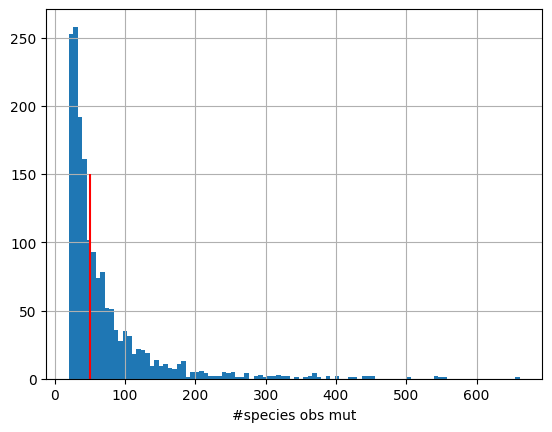

In [9]:
sp_count.hist(bins=100)
plt.xlabel("#species obs mut");
plt.vlines([MIN_MUT_NUM], 0, 150, 'r')

In [11]:
sp2mut = mutspec.pivot(index=["Class", "Species"], columns="Mut", values="MutSpec")
sp2mut = sp2mut[possible_sbs192]
print(sp2mut.shape)
sp2mut.head().round(2)

(757, 192)


Mut                                   A[A>C]A  A[A>C]C  A[A>C]G  A[A>C]T  \
Class       Species                                                        
Actinopteri Acanthopagrus_latus           0.0      0.0      0.0      0.0   
            Acheilognathus_tabira         0.0      0.0      0.0      0.0   
            Achondrostoma_arcasii         0.0      0.0      0.0      0.0   
            Achondrostoma_numantinum      0.0      0.0      0.0      0.0   
            Acipenser_stellatus           0.0      0.0      0.0      0.0   

Mut                                   C[A>C]A  C[A>C]C  C[A>C]G  C[A>C]T  \
Class       Species                                                        
Actinopteri Acanthopagrus_latus           0.0      0.0      0.0      0.0   
            Acheilognathus_tabira         0.0      0.0      0.0      0.0   
            Achondrostoma_arcasii         0.0      0.0      0.0      0.0   
            Achondrostoma_numantinum      0.0      0.0      0.0      0.0   
            Acipenser_stellatus           0.0      0.0      0.0      0.0   

Mut                                   G[A>C]A  G[A>C]C  ...  C[T>G]G  C[T>G]T  \
Class       Species                                     ...                     
Actinopteri Acanthopagrus_latus           0.0      0.0  ...      0.0     0.00   
            Acheilognathus_tabira         0.0      0.0  ...      0.0     0.00   
            Achondrostoma_arcasii         0.0      0.0  ...      0.0     0.00   
            Achondrostoma_numantinum      0.0      0.0  ...      0.0     0.04   
            Acipenser_stellatus           0.0      0.0  ...      0.0     0.08   

Mut                                   G[T>G]A  G[T>G]C  G[T>G]G  G[T>G]T  \
Class       Species                                                        
Actinopteri Acanthopagrus_latus           0.0      0.0      0.0      0.0   
            Acheilognathus_tabira         0.0      0.0      0.0      0.0   
            Achondrostoma_arcasii         0.0      0.0      0.0      0.0   
            Achondrostoma_numantinum      0.0      0.0      0.0      0.0   
            Acipenser_stellatus           0.0      0.0      0.0      0.0   

Mut                                   T[T>G]A  T[T>G]C  T[T>G]G  T[T>G]T  
Class       Species                                                       
Actinopteri Acanthopagrus_latus           0.0      0.0      0.0      0.0  
            Acheilognathus_tabira         0.0      0.0      0.0      0.0  
            Achondrostoma_arcasii         0.0      0.0      0.0      0.0  
            Achondrostoma_numantinum      0.0      0.0      0.0      0.0  
            Acipenser_stellatus           0.0      0.0      0.0      0.0  

[5 rows x 192 columns]

## Redusing dimensions

In [165]:
transitions = [x for x in possible_sbs192 if x[2:5] in {"C>T", "T>C", "A>G", "G>A"}]
len(transitions)

64

In [167]:
# df = sp2mut
df = sp2mut[transitions]

### PCA

PC1 (6.72% variance)
PC2 (5.72% variance)


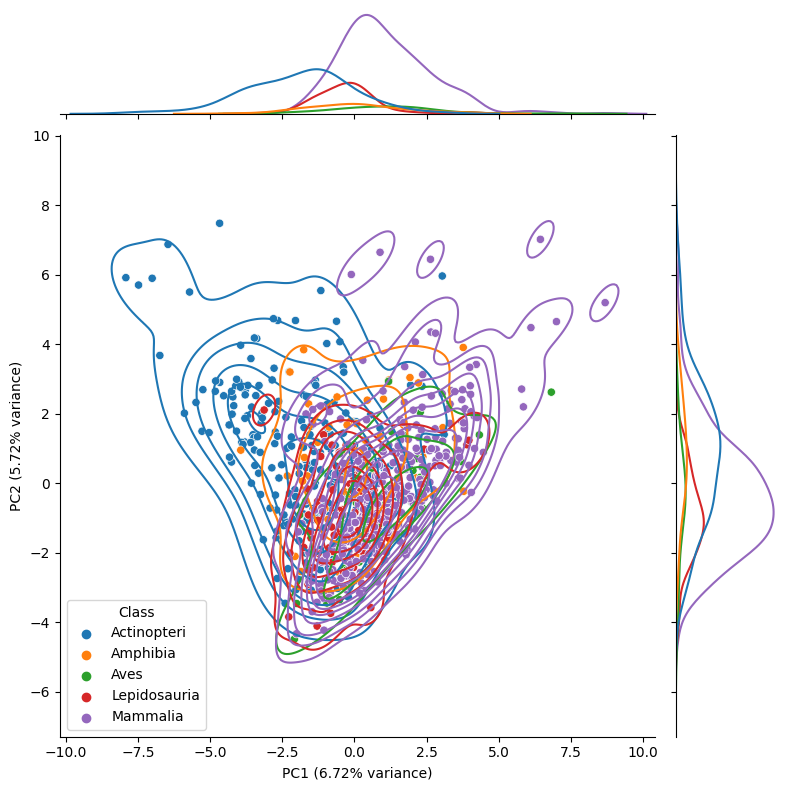

In [202]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Create a new dataframe with the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['Class'] = df.index.get_level_values(0)

# Get the variance share of each principal component
variance_ratio = pca.explained_variance_ratio_
variance_share_pc1 = round(variance_ratio[0]*100, 2)
variance_share_pc2 = round(variance_ratio[1]*100, 2)
print(f'PC1 ({variance_share_pc1}% variance)')
print(f'PC2 ({variance_share_pc2}% variance)')

g = sns.jointplot(
    data=pca_df,
    x="PC1", y="PC2", hue="Class",
    s=10,
    height=8, aspect=1.3, kind='kde',
)
g.plot_joint(sns.scatterplot)#, palette='Dark2', s=10, zorder=0, levels=6)
plt.xlabel(f'PC1 ({variance_share_pc1}% variance)')
plt.ylabel(f'PC2 ({variance_share_pc2}% variance)')
plt.show()

### UMAP & TSNE

In [169]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

In [170]:
pca = PCA()
X_pca = pca.fit_transform(df)
pca.explained_variance_ratio_[:40].sum()

0.9790236403751105

TSNE without PCA


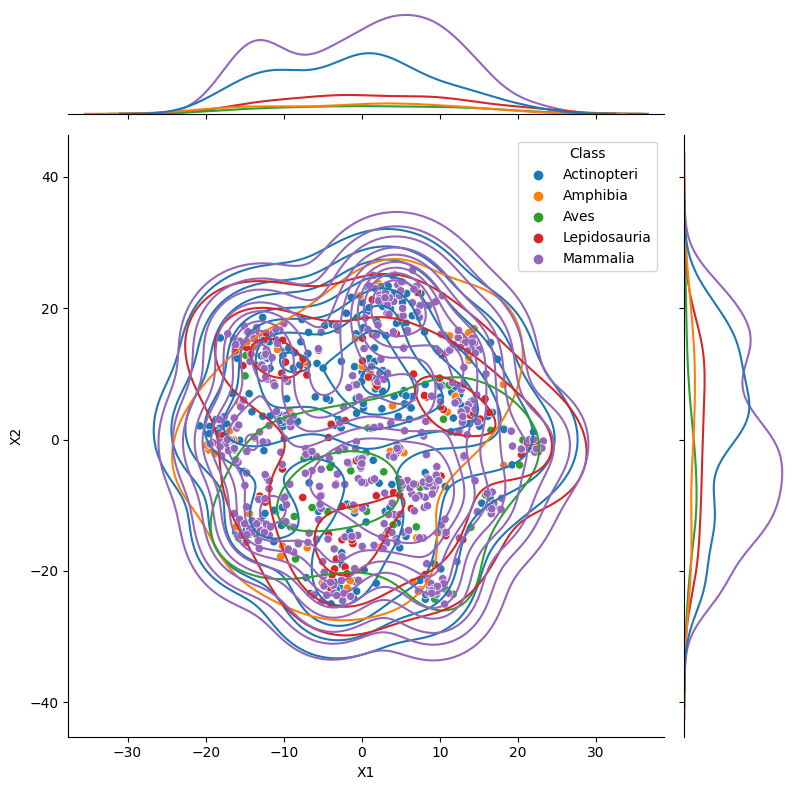

In [204]:
tsne = TSNE(2, n_jobs=8, metric='cosine')
X_tsne = tsne.fit_transform(df)

rdf = pd.DataFrame(columns=["X1", "X2"], data=X_tsne)
rdf["Class"] = df.index.get_level_values(0)

print("TSNE without PCA")
g = sns.jointplot(
    data=rdf,
    x="X1", y="X2", hue="Class",
    s=10,
    height=8, aspect=1.3, kind='kde',
)
g.plot_joint(sns.scatterplot)
plt.show()

TSNE with PCA (n_components=40)


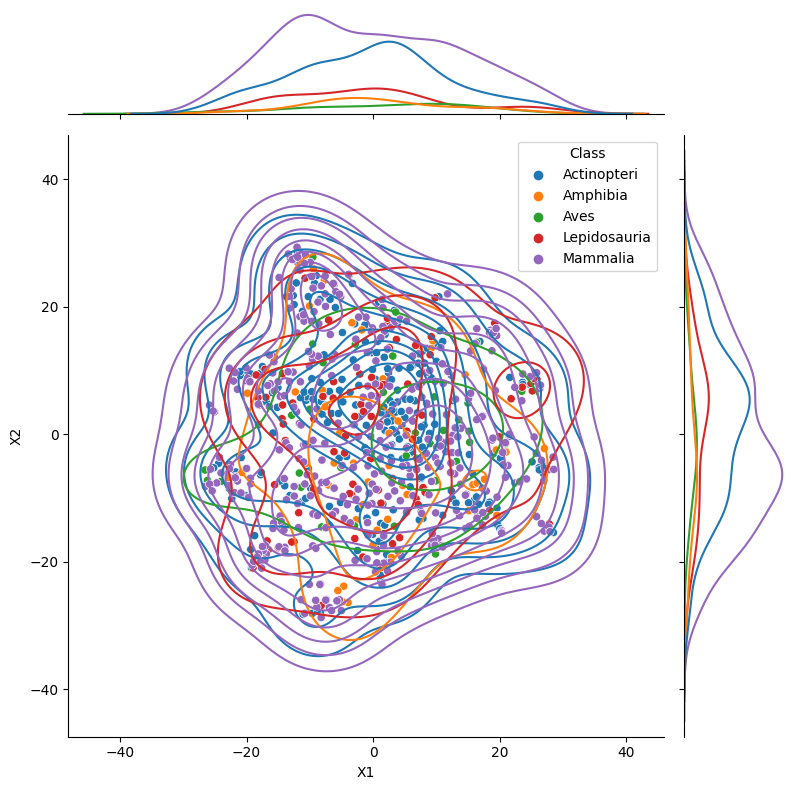

In [205]:
nfea = 40
tsne = TSNE(2, n_jobs=8)
X_tsne = tsne.fit_transform(X_pca[:, :nfea])

rdf = pd.DataFrame(columns=["X1", "X2"], data=X_tsne)
rdf["Class"] = df.index.get_level_values(0)

print(f"TSNE with PCA (n_components={nfea})")
g = sns.jointplot(
    data=rdf,
    x="X1", y="X2", hue="Class",
    s=10,
    height=8, aspect=1.3, kind='kde',
)
g.plot_joint(sns.scatterplot)
plt.show()

UMAP of spectra


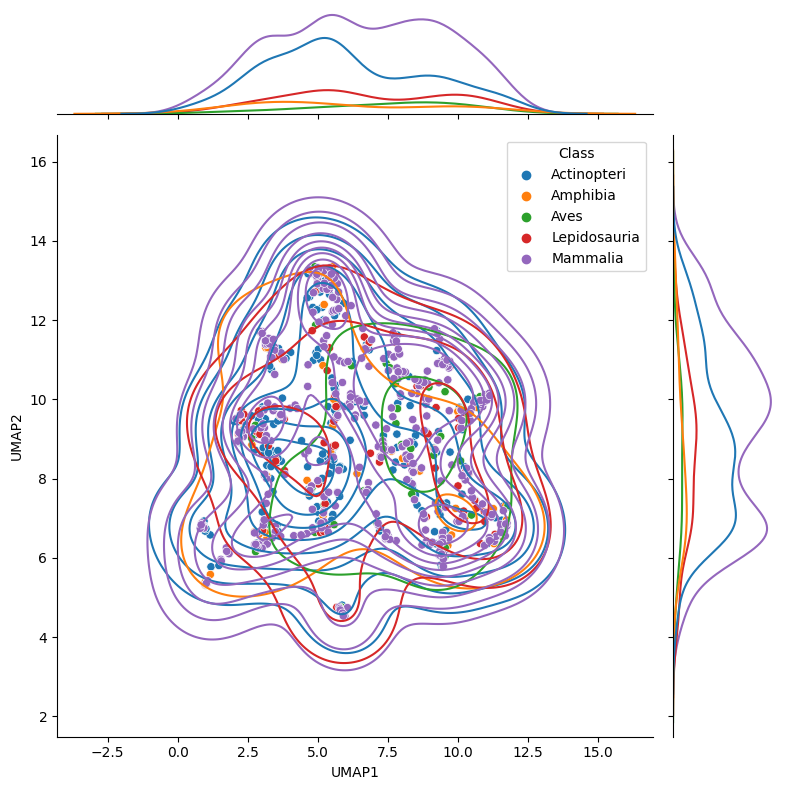

In [206]:
reducer = umap.UMAP(n_neighbors=7, metric="cosine")
X_umap = reducer.fit_transform(df)

rdf = pd.DataFrame(columns=["UMAP1", "UMAP2"], data=X_umap)
rdf["Class"] = df.index.get_level_values(0)

print(f"UMAP of spectra")
g = sns.jointplot(
    data=rdf,
    x="UMAP1", y="UMAP2", hue="Class",
    s=10,
    height=8, aspect=1.3, kind='kde',
)
g.plot_joint(sns.scatterplot)
plt.show()

UMAP with PCA (40)


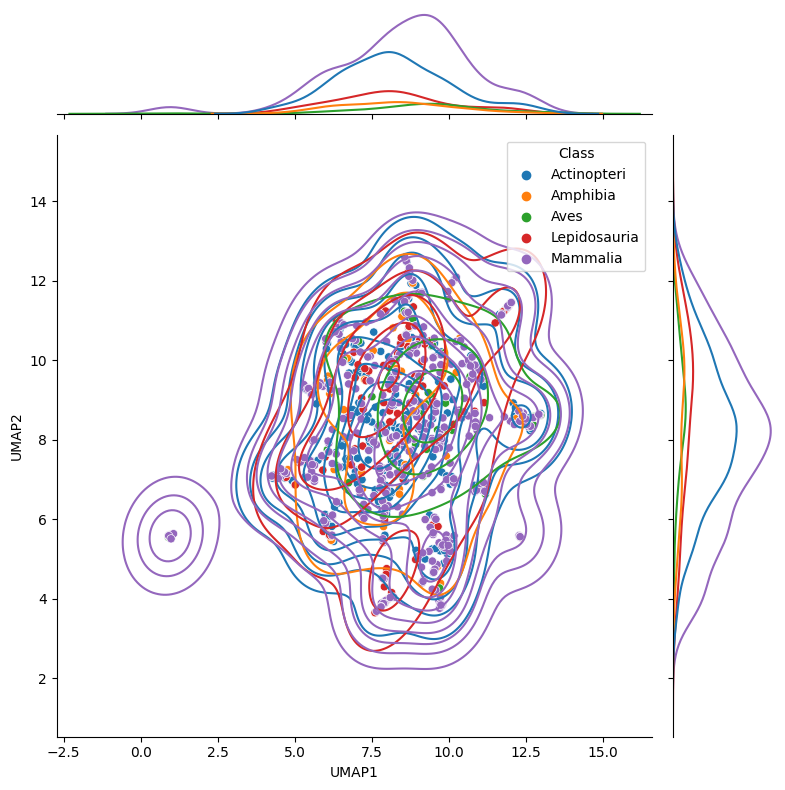

In [207]:
nfea = 40
reducer = umap.UMAP(n_neighbors=7)
X_umap = reducer.fit_transform(X_pca[:, :nfea])

rdf = pd.DataFrame(columns=["UMAP1", "UMAP2"], data=X_umap)
rdf["Class"] = df.index.get_level_values(0)

print(f"UMAP with PCA ({nfea})")
g = sns.jointplot(
    data=rdf,
    x="UMAP1", y="UMAP2", hue="Class",
    s=10,
    height=8, aspect=1.3, kind='kde',
)
g.plot_joint(sns.scatterplot)
plt.show()

## Pairwise species-specific comparison 192

- [link](https://seaborn.pydata.org/generated/seaborn.clustermap.html)
- [link](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage)
- [link](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.legend.html)
- [link](https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot)

In [12]:
data = []
cls_order = ['Aves', 'Lepidosauria', 'Amphibia', 'Actinopteri', 'Mammalia']
for _cls in cls_order:
    print(_cls)
    cls_sp = sp2mut.loc[_cls]
    cls_sp_sim = pd.DataFrame(1 - squareform(pdist(cls_sp, "cosine")), index=cls_sp.index, columns=cls_sp.index)
    dn = dendrogram(linkage(cls_sp_sim), no_plot=True)
    dn["leaves"]
    data.append(cls_sp.iloc[dn["leaves"]].assign(Class=_cls).reset_index().set_index(["Class", "Species"]))

sp2mut_sorted = pd.concat(data)

assert (sp2mut_sorted.sort_index() == sp2mut.sort_index()).all().all()

Aves
Lepidosauria
Amphibia
Actinopteri
Mammalia


### 192

In [13]:
sp2mut_sorted.head()

Mut                               A[A>C]A  A[A>C]C  A[A>C]G  A[A>C]T  \
Class Species                                                          
Aves  Pica_pica                       0.0      0.0      0.0      0.0   
      Gallus_gallus                   0.0      0.0      0.0      0.0   
      Dendrocincla_fuliginosa         0.0      0.0      0.0      0.0   
      Corvus_macrorhynchos            0.0      0.0      0.0      0.0   
      Phylloscopus_poliocephalus      0.0      0.0      0.0      0.0   

Mut                                C[A>C]A  C[A>C]C  C[A>C]G  C[A>C]T  \
Class Species                                                           
Aves  Pica_pica                   0.001911      0.0      0.0      0.0   
      Gallus_gallus               0.000000      0.0      0.0      0.0   
      Dendrocincla_fuliginosa     0.000000      0.0      0.0      0.0   
      Corvus_macrorhynchos        0.000000      0.0      0.0      0.0   
      Phylloscopus_poliocephalus  0.000000      0.0      0.0      0.0   

Mut                               G[A>C]A  G[A>C]C  ...  C[T>G]G  C[T>G]T  \
Class Species                                       ...                     
Aves  Pica_pica                       0.0      0.0  ...      0.0      0.0   
      Gallus_gallus                   0.0      0.0  ...      0.0      0.0   
      Dendrocincla_fuliginosa         0.0      0.0  ...      0.0      0.0   
      Corvus_macrorhynchos            0.0      0.0  ...      0.0      0.0   
      Phylloscopus_poliocephalus      0.0      0.0  ...      0.0      0.0   

Mut                               G[T>G]A  G[T>G]C  G[T>G]G  G[T>G]T  \
Class Species                                                          
Aves  Pica_pica                       0.0      0.0      0.0      0.0   
      Gallus_gallus                   0.0      0.0      0.0      0.0   
      Dendrocincla_fuliginosa         0.0      0.0      0.0      0.0   
      Corvus_macrorhynchos            0.0      0.0      0.0      0.0   
      Phylloscopus_poliocephalus      0.0      0.0      0.0      0.0   

Mut                                T[T>G]A  T[T>G]C  T[T>G]G  T[T>G]T  
Class Species                                                          
Aves  Pica_pica                   0.007747      0.0      0.0      0.0  
      Gallus_gallus               0.000000      0.0      0.0      0.0  
      Dendrocincla_fuliginosa     0.000000      0.0      0.0      0.0  
      Corvus_macrorhynchos        0.000000      0.0      0.0      0.0  
      Phylloscopus_poliocephalus  0.000000      0.0      0.0      0.0  

[5 rows x 192 columns]

In [14]:
sp_sim = pd.DataFrame(1 - squareform(pdist(sp2mut_sorted, "cosine")), index=sp2mut_sorted.index, columns=sp2mut_sorted.index)
sp_sim.head()

Class                                 Aves                \
Species                          Pica_pica Gallus_gallus   
Class Species                                              
Aves  Pica_pica                   1.000000      0.106595   
      Gallus_gallus               0.106595      1.000000   
      Dendrocincla_fuliginosa     0.579541      0.037628   
      Corvus_macrorhynchos        0.075136      0.093135   
      Phylloscopus_poliocephalus  0.482943      0.067772   

Class                                                                          \
Species                          Dendrocincla_fuliginosa Corvus_macrorhynchos   
Class Species                                                                   
Aves  Pica_pica                                 0.579541             0.075136   
      Gallus_gallus                             0.037628             0.093135   
      Dendrocincla_fuliginosa                   1.000000             0.279071   
      Corvus_macrorhynchos                      0.279071             1.000000   
      Phylloscopus_poliocephalus                0.548752             0.324308   

Class                                                                         \
Species                          Phylloscopus_poliocephalus Alectoris_chukar   
Class Species                                                                  
Aves  Pica_pica                                    0.482943         0.024220   
      Gallus_gallus                                0.067772         0.017422   
      Dendrocincla_fuliginosa                      0.548752         0.685587   
      Corvus_macrorhynchos                         0.324308         0.357816   
      Phylloscopus_poliocephalus                   1.000000         0.518959   

Class                                                               \
Species                          Garrulax_chinensis Xenops_minutus   
Class Species                                                        
Aves  Pica_pica                            0.103608       0.013128   
      Gallus_gallus                        0.020791       0.034462   
      Dendrocincla_fuliginosa              0.551520       0.395827   
      Corvus_macrorhynchos                 0.447739       0.487945   
      Phylloscopus_poliocephalus           0.653186       0.639429   

Class                                                                      \
Species                          Cinclosoma_clarum Glyphorynchus_spirurus   
Class Species                                                               
Aves  Pica_pica                           0.050185               0.083516   
      Gallus_gallus                       0.042925               0.181786   
      Dendrocincla_fuliginosa             0.405413               0.504006   
      Corvus_macrorhynchos                0.219292               0.380231   
      Phylloscopus_poliocephalus          0.227198               0.399650   

Class                             ...      Mammalia                        \
Species                           ... Rusa_unicolor Stenella_longirostris   
Class Species                     ...                                       
Aves  Pica_pica                   ...      0.064732              0.130857   
      Gallus_gallus               ...      0.021951              0.047833   
      Dendrocincla_fuliginosa     ...      0.345813              0.325661   
      Corvus_macrorhynchos        ...      0.113743              0.061324   
      Phylloscopus_poliocephalus  ...      0.104535              0.090197   

Class                                                                  \
Species                          Niviventer_fulvescens Tamias_amoenus   
Class Species                                                           
Aves  Pica_pica                               0.084517       0.078640   
      Gallus_gallus                           0.039530       0.029153   
      Dendrocincla_fuliginosa                 0.268837       0.318006

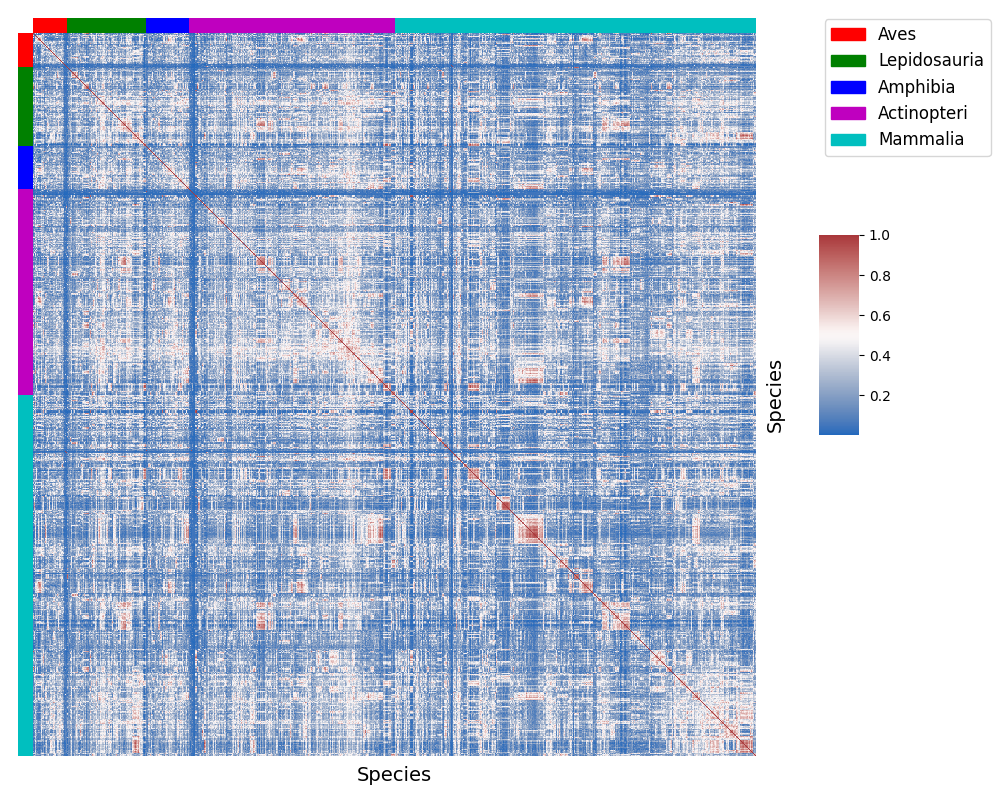

In [179]:
cls_colors = "rgbmc"

g = sns.clustermap(
    sp_sim, 
    cmap="vlag",
    metric="cosine",
    row_cluster=False,
    col_cluster=False,
    row_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    col_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    cbar_pos=(1.03, 0.45, 0.05, 0.25),
    xticklabels=False,
    yticklabels=False,
    figsize=(8, 8),
    dendrogram_ratio=0.01,
    colors_ratio=0.02,
)

g.ax_heatmap.set_xlabel("Species", fontsize=14)
g.ax_heatmap.set_ylabel("Species", fontsize=14)

patches = [mpatches.Patch(color=clr, label=c) for clr, c in zip(cls_colors, cls_order)]

plt.legend(handles=patches, fontsize=12, bbox_to_anchor=(4.5, 2.12))


plt.savefig("../pictures/cls_pairwise_compare/species_pairwise_similarity.png", bbox_inches="tight")
plt.show()

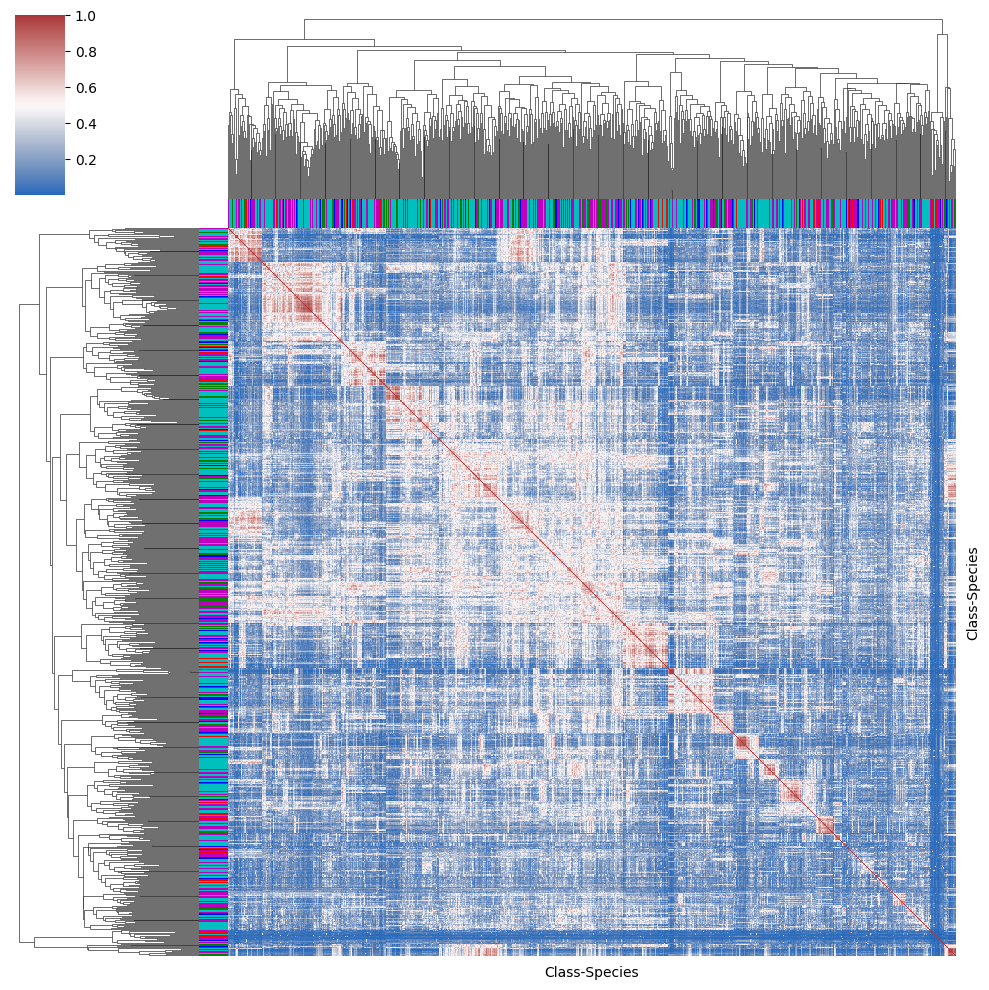

In [180]:
cls_colors = "rgbmc"

sns.clustermap(
    sp_sim, cmap="vlag", 
    row_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    col_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    xticklabels=False,
    yticklabels=False,
);

Cannot see class similarities

### 12

In [15]:
from pymutspec.annotation.spectra import collapse_sbs192
sp2mut_sorted12 = collapse_sbs192(sp2mut_sorted, 12)
sp2mut_sorted12

Mut                                       A>C       A>G       A>T       C>A  \
Class    Species                                                              
Aves     Pica_pica                   0.003056  0.045705  0.000000  0.002153   
         Gallus_gallus               0.000000  0.032388  0.005014  0.015030   
         Dendrocincla_fuliginosa     0.000000  0.048138  0.012615  0.006684   
         Corvus_macrorhynchos        0.000000  0.088751  0.000000  0.032681   
         Phylloscopus_poliocephalus  0.000000  0.046823  0.000000  0.039917   
...                                       ...       ...       ...       ...   
Mammalia Oxymycterus_quaestor        0.002941  0.098223  0.000000  0.007793   
         Reithrodontomys_megalotis   0.000000  0.075347  0.005728  0.073627   
         Lepus_timidus               0.013871  0.090408  0.026996  0.025368   
         Saccostomus_campestris      0.000000  0.107718  0.006100  0.004253   
         Thylamys_pusillus           0.000000  0.040537  0.042820  0.000000   

Mut                                       C>G       C>T       G>A       G>C  \
Class    Species                                                              
Aves     Pica_pica                   0.001077  0.045788  0.814800  0.000000   
         Gallus_gallus               0.006305  0.023320  0.812111  0.012568   
         Dendrocincla_fuliginosa     0.000000  0.109198  0.658413  0.000000   
         Corvus_macrorhynchos        0.000000  0.233652  0.372837  0.000000   
         Phylloscopus_poliocephalus  0.000000  0.099017  0.577489  0.000000   
...                                       ...       ...       ...       ...   
Mammalia Oxymycterus_quaestor        0.000000  0.050924  0.540084  0.000000   
         Reithrodontomys_megalotis   0.015360  0.299982  0.317192  0.000000   
         Lepus_timidus               0.000000  0.228068  0.356601  0.000000   
         Saccostomus_campestris      0.000000  0.058628  0.597127  0.056179   
         Thylamys_pusillus           0.000000  0.079931  0.596227  0.000000   

Mut                                       G>T       T>A       T>C       T>G  
Class    Species                                                             
Aves     Pica_pica                   0.000000  0.006788  0.072886  0.007747  
         Gallus_gallus               0.000000  0.000000  0.093263  0.000000  
         Dendrocincla_fuliginosa     0.016925  0.000000  0.148026  0.000000  
         Corvus_macrorhynchos        0.067753  0.000000  0.204327  0.000000  
         Phylloscopus_poliocephalus  0.000000  0.000000  0.236753  0.000000  
...                                       ...       ...       ...       ...  
Mammalia Oxymycterus_quaestor        0.000000  0.000000  0.300035  0.000000  
         Reithrodontomys_megalotis   0.000000  0.011358  0.196292  0.005115  
         Lepus_timidus               0.000000  0.015419  0.243270  0.000000  
         Saccostomus_campestris      0.000000  0.000000  0.159375  0.010621  
         Thylamys_pusillus           0.067031  0.032163  0.141290  0.000000  

[757 rows x 12 columns]

In [16]:
sp_sim12 = pd.DataFrame(1 - squareform(pdist(sp2mut_sorted12, "cosine")), 
                      index=sp2mut_sorted12.index, columns=sp2mut_sorted12.index)
sp_sim12.head()

Class                                 Aves                \
Species                          Pica_pica Gallus_gallus   
Class Species                                              
Aves  Pica_pica                   1.000000      0.998815   
      Gallus_gallus               0.998815      1.000000   
      Dendrocincla_fuliginosa     0.985352      0.984714   
      Corvus_macrorhynchos        0.814570      0.809568   
      Phylloscopus_poliocephalus  0.949103      0.953207   

Class                                                                          \
Species                          Dendrocincla_fuliginosa Corvus_macrorhynchos   
Class Species                                                                   
Aves  Pica_pica                                 0.985352             0.814570   
      Gallus_gallus                             0.984714             0.809568   
      Dendrocincla_fuliginosa                   1.000000             0.897114   
      Corvus_macrorhynchos                      0.897114             1.000000   
      Phylloscopus_poliocephalus                0.984494             0.922728   

Class                                                                         \
Species                          Phylloscopus_poliocephalus Alectoris_chukar   
Class Species                                                                  
Aves  Pica_pica                                    0.949103         0.997574   
      Gallus_gallus                                0.953207         0.997078   
      Dendrocincla_fuliginosa                      0.984494         0.972513   
      Corvus_macrorhynchos                         0.922728         0.775772   
      Phylloscopus_poliocephalus                   1.000000         0.929063   

Class                                                               \
Species                          Garrulax_chinensis Xenops_minutus   
Class Species                                                        
Aves  Pica_pica                            0.986437       0.771688   
      Gallus_gallus                        0.991119       0.774856   
      Dendrocincla_fuliginosa              0.988111       0.864449   
      Corvus_macrorhynchos                 0.840167       0.969921   
      Phylloscopus_poliocephalus           0.975665       0.919006   

Class                                                                      \
Species                          Cinclosoma_clarum Glyphorynchus_spirurus   
Class Species                                                               
Aves  Pica_pica                           0.699092               0.736772   
      Gallus_gallus                       0.711643               0.745275   
      Dendrocincla_fuliginosa             0.794772               0.829053   
      Corvus_macrorhynchos                0.881797               0.919792   
      Phylloscopus_poliocephalus          0.882268               0.907627   

Class                             ...      Mammalia                        \
Species                           ... Rusa_unicolor Stenella_longirostris   
Class Species                     ...                                       
Aves  Pica_pica                   ...      0.929405              0.904573   
      Gallus_gallus               ...      0.930612              0.909716   
      Dendrocincla_fuliginosa     ...      0.976118              0.959007   
      Corvus_macrorhynchos        ...      0.949025              0.938998   
      Phylloscopus_poliocephalus  ...      0.994531              0.989242   

Class                                                                  \
Species                          Niviventer_fulvescens Tamias_amoenus   
Class Species                                                           
Aves  Pica_pica                               0.879007       0.962304   
      Gallus_gallus                           0.886103       0.956381   
      Dendrocincla_fuliginosa                 0.903712       0.987464

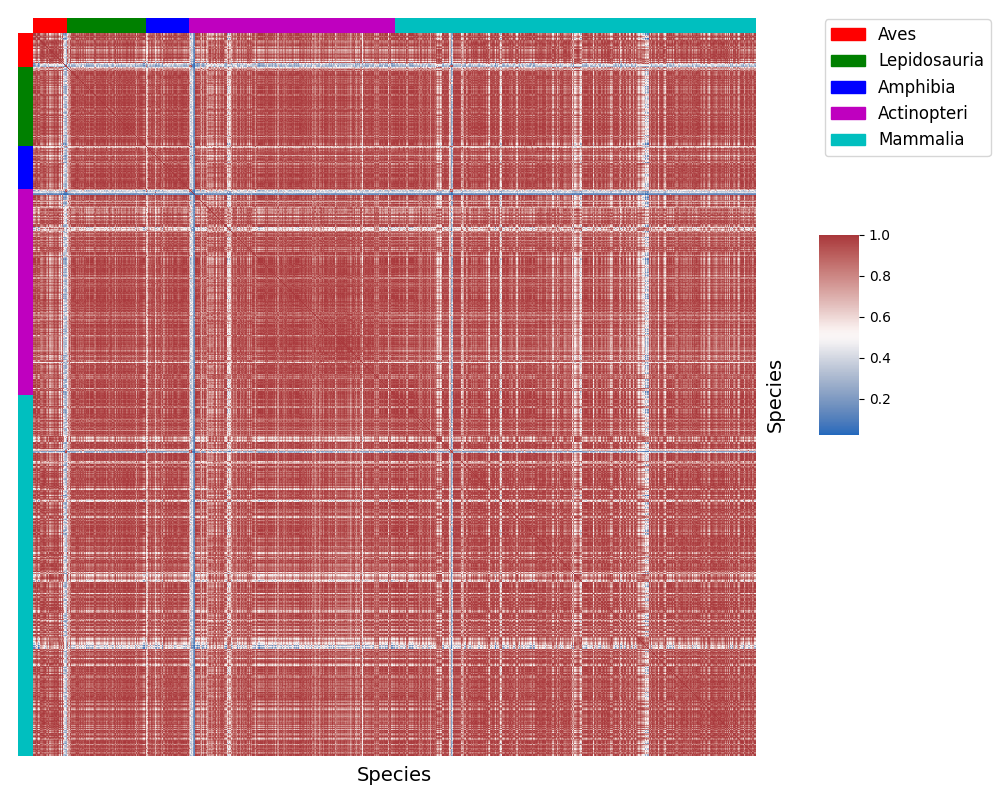

In [17]:
cls_colors = "rgbmc"

g = sns.clustermap(
    sp_sim12, 
    cmap="vlag",
    metric="cosine",
    row_cluster=False,
    col_cluster=False,
    row_colors=sp_sim12.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    col_colors=sp_sim12.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    cbar_pos=(1.03, 0.45, 0.05, 0.25),
    xticklabels=False,
    yticklabels=False,
    figsize=(8, 8),
    dendrogram_ratio=0.01,
    colors_ratio=0.02,
)

g.ax_heatmap.set_xlabel("Species", fontsize=14)
g.ax_heatmap.set_ylabel("Species", fontsize=14)

patches = [mpatches.Patch(color=clr, label=c) for clr, c in zip(cls_colors, cls_order)]

plt.legend(handles=patches, fontsize=12, bbox_to_anchor=(4.5, 2.12))


plt.savefig("../pictures/cls_pairwise_compare/species_pairwise_similarity12.png", bbox_inches="tight")
plt.show()

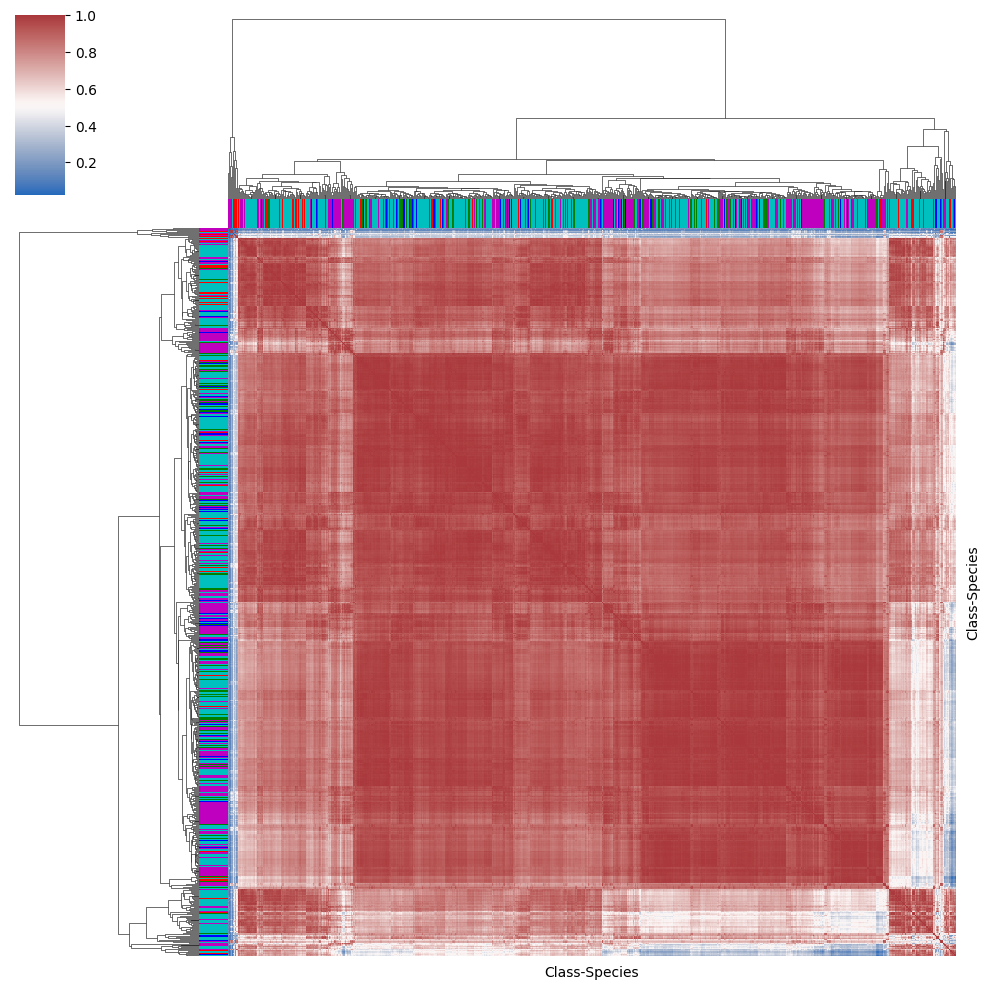

In [18]:
cls_colors = "rgbmc"

sns.clustermap(
    sp_sim12, cmap="vlag", 
    row_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    col_colors=sp_sim.index.get_level_values(0).map(dict(zip(cls_order, cls_colors))),
    xticklabels=False,
    yticklabels=False,
);

Cannot see class similarities

In [181]:
data = []
for cl1 in sp_sim.index.levels[0]:
    for cl2 in sp_sim.index.levels[0]:
        if cl1 == cl2:
            cur_sims = 1 - pdist(sp2mut.loc[cl1, possible_sbs192], "cosine")
        else:
            cur_sims = 1 - cdist(sp2mut.loc[cl1, possible_sbs192], sp2mut.loc[cl2, possible_sbs192], "cosine").flatten()
        data.append([cl1, cl2, cur_sims])

cls_sims = pd.DataFrame(data, columns=["cls1", "cls2", "pp_sims"])

In [182]:
cls_sims.head()

,cls1,cls2,pp_sims
0,Actinopteri,Actinopteri,"[0.3627531268752133, 0.12581502620740892, 0.41..."
1,Actinopteri,Amphibia,"[0.2217805484409029, 0.23038765657141025, 0.18..."
2,Actinopteri,Aves,"[0.1226127164898363, 0.2426572392547205, 0.065..."
3,Actinopteri,Lepidosauria,"[0.15109692227734128, 0.18473092427294469, 0.2..."
4,Actinopteri,Mammalia,"[0.6410558031817207, 0.3807937679955684, 0.223..."


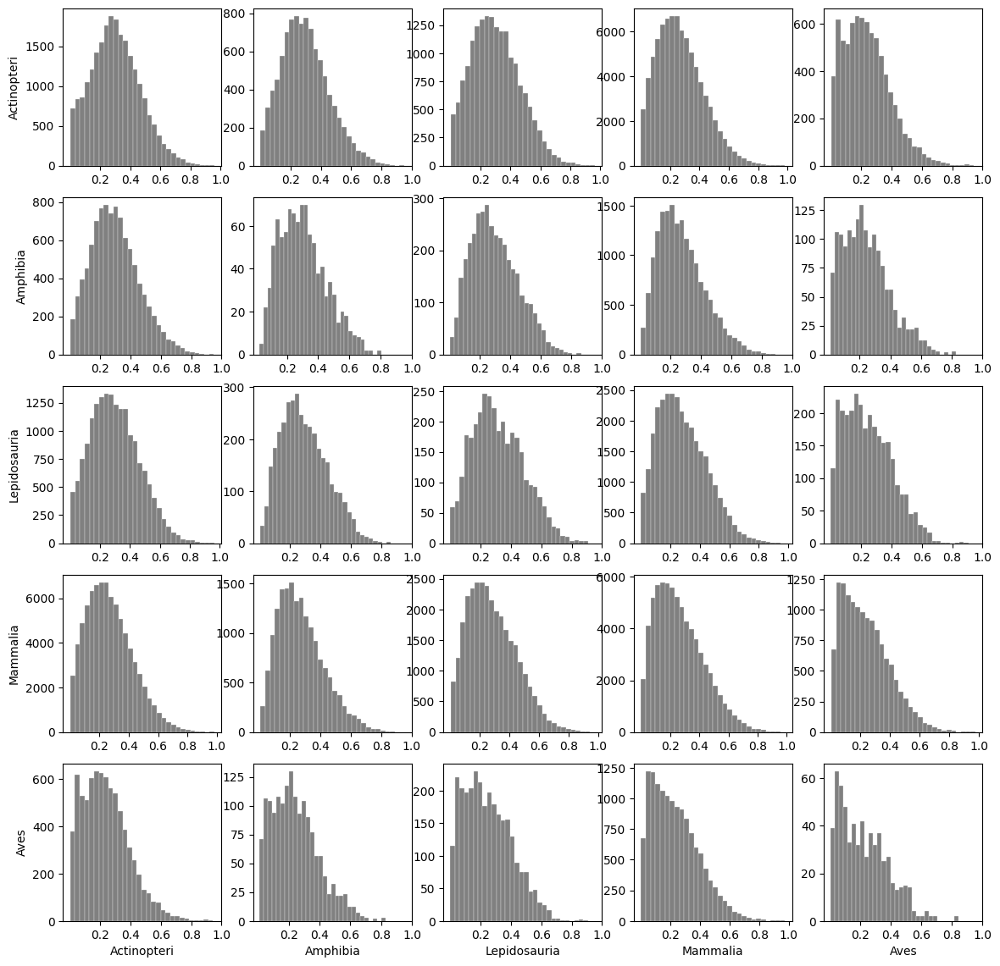

In [183]:
cur_order = ['Actinopteri', 'Amphibia', 'Lepidosauria', 'Mammalia', 'Aves']


plt.figure(figsize=(14, 14))
for i, cl1 in enumerate(cur_order, 1):
    for j, cl2 in enumerate(cur_order, 1):
        plt.subplot(5, 5, (i-1)*5+j)
        if j % 5 == 1:
            plt.ylabel(cl1)
        if i == 5:
            plt.xlabel(cl2)
        plt.hist(cls_sims[(cls_sims.cls1 == cl1) & (cls_sims.cls2 == cl2)].pp_sims.item(), bins=30, color="gray", linewidth=0.2, edgecolor="white")
        # plt.vlines([cls_sims[(cls_sims.cls1 == cl1) & (cls_sims.cls2 == cl2)].pp_sims.item().mean()], 0, 500, 'red')
        plt.xticks([0.2, .4, .6, .8, 1])
plt.savefig("../pictures/cls_pairwise_compare/cls_pairwise_similarity_distributions192.pdf", bbox_inches="tight")
plt.show()

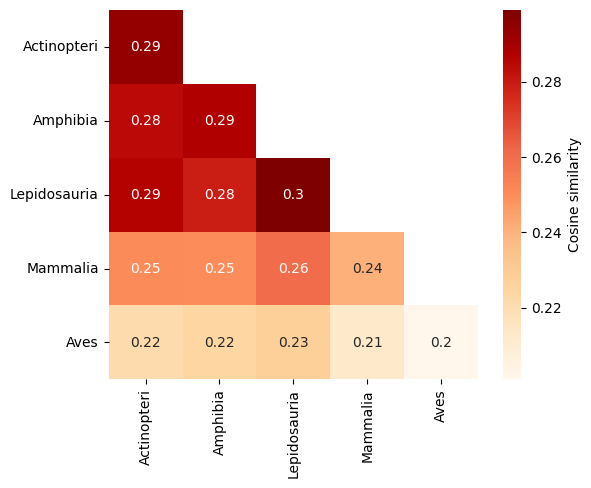

In [184]:
ax = sns.heatmap(
    cls_sims.set_index(["cls1", "cls2"]).pp_sims.apply(np.median).unstack().loc[cur_order, cur_order], 
    annot=True, cmap="OrRd", square=True, mask=np.triu(np.ones(5), 1),
    cbar_kws={"label": "Cosine similarity"}
)

ax.set_xlabel(None)
ax.set_ylabel(None)

plt.savefig("../pictures/cls_pairwise_compare/cls_pairwise_similarity_median192.pdf", bbox_inches="tight")
plt.show()

## Pairwise species-specific comparison 12

In [185]:
s192to12 = dict()
for sbs192 in possible_sbs192:
    s192to12[sbs192] = sbs192[2:5]

In [186]:
for sbs192 in possible_sbs192:
    sbs12 = sbs192[2:5]
    if sbs12 in sp2mut.columns:
        sp2mut[sbs12] += sp2mut[sbs192]
    else:
        sp2mut[sbs12] = sp2mut[sbs192]

In [187]:
data = []
cls_order = ['Aves', 'Lepidosauria', 'Amphibia', 'Actinopteri', 'Mammalia']
for _cls in cls_order:
    print(_cls)
    cls_sp = sp2mut.loc[_cls]
    cls_sp_sim = pd.DataFrame(1 - squareform(pdist(cls_sp[possible_sbs12], "cosine")), index=cls_sp.index, columns=cls_sp.index)
    dn = dendrogram(linkage(cls_sp_sim), no_plot=True)
    dn["leaves"]
    data.append(cls_sp.iloc[dn["leaves"]].assign(Class=_cls).reset_index().set_index(["Class", "Species"])[possible_sbs12])

sp2mut_sorted = pd.concat(data)

assert (sp2mut_sorted.sort_index() == sp2mut[possible_sbs12].sort_index()).all().all()

Aves
Lepidosauria
Amphibia
Actinopteri
Mammalia


In [188]:
sp2mut_sorted.head()

Mut                               A>C       A>G       A>T       C>A       C>G  \
Class Species                                                                   
Aves  Microspingus_cabanisi  0.000000  0.054633  0.009168  0.028740  0.000000   
      Paradisaea_raggiana    0.000000  0.046907  0.016956  0.160544  0.000000   
      Emberiza_godlewskii    0.000000  0.051296  0.005147  0.011283  0.000000   
      Alectoris_chukar       0.002495  0.022643  0.000000  0.003130  0.001576   
      Gallus_gallus          0.000000  0.032388  0.005014  0.015030  0.006305   

Mut                               C>T       G>A       G>C  G>T  T>A       T>C  \
Class Species                                                                   
Aves  Microspingus_cabanisi  0.118618  0.067300  0.000000  0.0  0.0  0.721541   
      Paradisaea_raggiana    0.260391  0.032978  0.000000  0.0  0.0  0.482225   
      Emberiza_godlewskii    0.098819  0.179788  0.000000  0.0  0.0  0.653666   
      Alectoris_chukar       0.013116  0.916329  0.000000  0.0  0.0  0.040711   
      Gallus_gallus          0.023320  0.812111  0.012568  0.0  0.0  0.093263   

Mut                          T>G  
Class Species                     
Aves  Microspingus_cabanisi  0.0  
      Paradisaea_raggiana    0.0  
      Emberiza_godlewskii    0.0  
      Alectoris_chukar       0.0  
      Gallus_gallus          0.0

In [189]:
sp_sim = pd.DataFrame(1 - squareform(pdist(sp2mut_sorted, "cosine")), index=sp2mut_sorted.index, columns=sp2mut_sorted.index)
sp_sim.head()

Class                                        Aves                      \
Species                     Microspingus_cabanisi Paradisaea_raggiana   
Class Species                                                           
Aves  Microspingus_cabanisi              1.000000            0.917824   
      Paradisaea_raggiana                0.917824            1.000000   
      Emberiza_godlewskii                0.984694            0.890086   
      Alectoris_chukar                   0.138892            0.104065   
      Gallus_gallus                      0.210428            0.174106   

Class                                                             \
Species                     Emberiza_godlewskii Alectoris_chukar   
Class Species                                                      
Aves  Microspingus_cabanisi            0.984694         0.138892   
      Paradisaea_raggiana              0.890086         0.104065   
      Emberiza_godlewskii              1.000000         0.307441   
      Alectoris_chukar                 0.307441         1.000000   
      Gallus_gallus                    0.375310         0.997078   

Class                                                                     \
Species                     Gallus_gallus Pica_pica Cymbilaimus_lineatus   
Class Species                                                              
Aves  Microspingus_cabanisi      0.210428  0.190830             0.916947   
      Paradisaea_raggiana        0.174106  0.162194             0.887323   
      Emberiza_godlewskii        0.375310  0.356485             0.956184   
      Alectoris_chukar           0.997078  0.997574             0.445733   
      Gallus_gallus              1.000000  0.998815             0.508657   

Class                                                                  \
Species                     Corvus_splendens Microcerculus_marginatus   
Class Species                                                           
Aves  Microspingus_cabanisi         0.897800                 0.871814   
      Paradisaea_raggiana           0.830500                 0.843664   
      Emberiza_godlewskii           0.954462                 0.927860   
      Alectoris_chukar              0.534477                 0.531877   
      Gallus_gallus                 0.595009                 0.590785   

Class                                                ...        Mammalia  \
Species                     Dendrocincla_fuliginosa  ... Lophuromys_zena   
Class Species                                        ...                   
Aves  Microspingus_cabanisi                0.330501  ...        0.583885   
      Paradisaea_raggiana                  0.317682  ...        0.568789   
      Emberiza_godlewskii                  0.485056  ...        0.702526   
      Alectoris_chukar                     0.972513  ...        0.835696   
      Gallus_gallus                        0.984714  ...        0.871688   

Class                                                        \
Species                     Microtus_lusitanicus Mus_caroli   
Class Species                                                 
Aves  Microspingus_cabanisi             0.591279   0.680218   
      Paradisaea_raggiana               0.550880   0.748817   
      Emberiza_godlewskii               0.713818   0.752758   
      Alectoris_chukar                  0.850262   0.605768   
      Gallus_gallus                     0.885364   0.650342   

Class                                                                     \
Species                     Reithrodontomys_sumichrasti Artibeus_glaucus   
Class Species                                                              
Aves  Microspingus_cabanisi                    0.594860         0.737597   
      Paradisaea_raggiana                      0.720791         0.858659   
      Emberiza_godlewskii                      0.667173         0.743344   
      Alectoris_chukar                         0.605948         0.255163   
      Gallus_gallus           

In [192]:
sp_sim12 = pd.DataFrame(1 - squareform(pdist(sp2mut[possible_sbs12], "cosine")), index=sp2mut.index, columns=sp2mut.index)

In [193]:
data = []
for cl1 in sp_sim12.index.levels[0]:
    for cl2 in sp_sim12.index.levels[0]:
        if cl1 == cl2:
            cur_sims = 1 - pdist(sp2mut.loc[cl1, possible_sbs12], "cosine")
        else:
            cur_sims = 1 - cdist(sp2mut.loc[cl1, possible_sbs12], sp2mut.loc[cl2, possible_sbs12], "cosine").flatten()
        data.append([cl1, cl2, cur_sims])

cls_sims12 = pd.DataFrame(data, columns=["cls1", "cls2", "pp_sims"])

In [194]:
cls_sims12.head()

,cls1,cls2,pp_sims
0,Actinopteri,Actinopteri,"[0.9843865843016774, 0.9402127280829454, 0.900..."
1,Actinopteri,Amphibia,"[0.971721722423356, 0.9746351051478863, 0.8789..."
2,Actinopteri,Aves,"[0.8411323482858815, 0.8243422566371259, 0.350..."
3,Actinopteri,Lepidosauria,"[0.9641621958767086, 0.9526559192294294, 0.949..."
4,Actinopteri,Mammalia,"[0.9880070107269142, 0.9265390236029288, 0.830..."


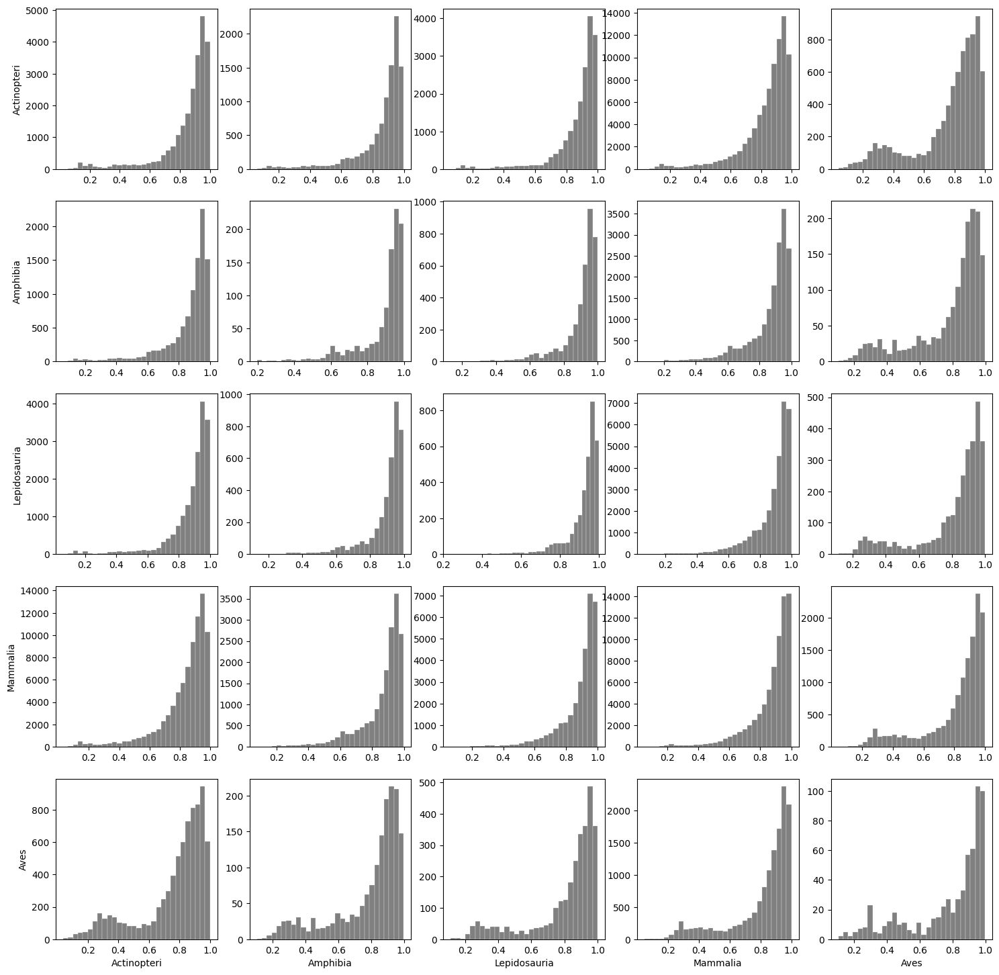

In [198]:
cur_order = ['Actinopteri', 'Amphibia', 'Lepidosauria', 'Mammalia', 'Aves']


plt.figure(figsize=(18, 18))
for i, cl1 in enumerate(cur_order, 1):
    for j, cl2 in enumerate(cur_order, 1):
        plt.subplot(5, 5, (i-1)*5+j)
        if j % 5 == 1:
            plt.ylabel(cl1)
        if i == 5:
            plt.xlabel(cl2)
        plt.hist(cls_sims12[(cls_sims12.cls1 == cl1) & (cls_sims12.cls2 == cl2)].pp_sims.item(), 
                 bins=30, color="gray", linewidth=0.2, edgecolor="white")
        # plt.vlines([cls_sims12[(cls_sims12.cls1 == cl1) & (cls_sims12.cls2 == cl2)].pp_sims.item().mean()], 0, 500, 'red')
        plt.xticks([0.2, .4, .6, .8, 1])
plt.savefig("../pictures/cls_pairwise_compare/cls_pairwise_similarity_distributions12.pdf", 
            bbox_inches="tight")
plt.show()

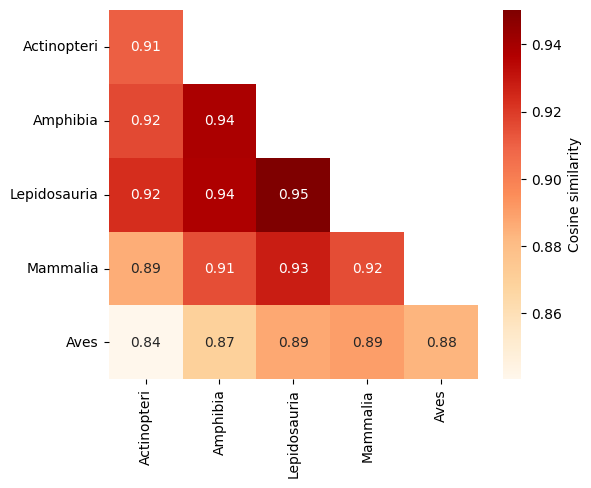

In [196]:
ax = sns.heatmap(
    cls_sims12.set_index(["cls1", "cls2"]).pp_sims.apply(np.median).unstack().loc[cur_order, cur_order], 
    annot=True, cmap="OrRd", square=True, mask=np.triu(np.ones(5), 1),
    cbar_kws={"label": "Cosine similarity"}
)

ax.set_xlabel(None)
ax.set_ylabel(None)

plt.savefig("../pictures/cls_pairwise_compare/cls_pairwise_similarity_median12.pdf", bbox_inches="tight")
plt.show()